In [ ]:
import pandas as pd
import pickle
import matplotlib.pyplot as plt
import shap

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
import xgboost as xgb
import lightgbm as lgb
from catboost import CatBoostRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# from evidently.report import Report
# from evidently.metrics import RegressionQualityMetric, RegressionErrorPlot, RegressionErrorDistribution, Comment, DatasetSummaryMetric
# from evidently.metric_preset import DataDriftPreset, RegressionPreset


In [ ]:
df = pd.read_csv("/kaggle/input/training-data/training_data (2).csv")
sentiment_data = pd.read_csv("/kaggle/input/senti-data/senti_data.csv")

In [ ]:
# Initialize a dictionary to store label encoders
label_encoders = {}

# Create a copy of the original DataFrame to preserve the original data
encoded_df = df.copy()

# List of categorical columns to be label encoded
categorical_columns = ['property_type', 'room_type', 'bed_type',
                       'cancellation_policy', 'city',
                       'host_has_profile_pic', 'host_identity_verified',
                       'instant_bookable', 'cleaning_fee']

# Apply label encoding to each categorical column
for column in categorical_columns:
    # Initialize LabelEncoder
    label_encoder = LabelEncoder()

    # Apply label encoding to the column
    encoded_df[column] = label_encoder.fit_transform(encoded_df[column])

    # Store the label encoder object in the dictionary
    label_encoders[column] = label_encoder

# Save the label encoders to a file using pickle
with open('label_encoders.pkl', 'wb') as f:
    pickle.dump(label_encoders, f)


In [ ]:
# Extracting month from date columns and adding them as new columns
df['first_review_m'] = pd.to_datetime(df['first_review']).dt.month
df['host_since_m'] = pd.to_datetime(df['host_since']).dt.month
df['last_review_m'] = pd.to_datetime(df['last_review']).dt.month

# Selecting columns of interest
int_df = df[['id', 'log_price', 'accommodates', 'bathrooms', 'zipcode','neighbourhood_encoded',
             'host_response_rate', 'number_of_reviews', 'review_scores_rating',
             'bedrooms', 'latitude', 'longitude','beds', 'review_duration', 'time_since_last_review',
             'host_tenure', 'average_review_score', 'amenities_count',
             'has_wireless_internet', 'has_kitchen', 'has_heating', 'has_essentials',
             'has_smoke_detector','first_review_m', 'host_since_m', 'last_review_m',]]


In [ ]:
label_encoder_senti = LabelEncoder()
sentiment_data['sentiment_category'] = label_encoder_senti.fit_transform(sentiment_data['sentiment_category'])

# Save this to labelencoders dict
label_encoders['sentiment_category'] = label_encoder_senti

In [ ]:
Model_training_df = pd.concat([int_df, encoded_df[categorical_columns],sentiment_data['sentiment_category']], axis=1)

In [ ]:
X = Model_training_df.drop("log_price", axis=1)

y = Model_training_df['log_price']

---

In [ ]:
# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize regression models
models = {
    'linear_regression': LinearRegression(),
    'ridge_regression': Ridge(),
    'lasso_regression': Lasso(),
    'elastic_net_regression': ElasticNet(),
    'decision_tree_regression': DecisionTreeRegressor(),
    'random_forest_regression': RandomForestRegressor(),
    'gradient_boosting_regression': GradientBoostingRegressor(),
    'xgboost_regression': xgb.XGBRegressor(),
    'lightgbm_regression': lgb.LGBMRegressor(),
    'catboost_regression': CatBoostRegressor(silent=True)
}

# Train each model
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Calculate Mean Squared Error (MSE)
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    # Print the evaluation metric
    print(f"{name} MSE: {mse}")
    print(f"{name} MSE: {mae}")

    print("-"*30)


# Save the models dictionary to a pickle file
with open('trained_models.pkl', 'wb') as f:
    pickle.dump(models, f)

linear_regression MSE: 0.2345703679069435
linear_regression MSE: 0.36350034347637267
------------------------------
ridge_regression MSE: 0.23457080577368813
ridge_regression MSE: 0.3635002848955916
------------------------------
lasso_regression MSE: 0.5059901469503172
lasso_regression MSE: 0.5550222372563071
------------------------------
elastic_net_regression MSE: 0.3999987876578443
elastic_net_regression MSE: 0.48878860969443066
------------------------------
decision_tree_regression MSE: 0.318172686448424
decision_tree_regression MSE: 0.40878492734756794
------------------------------



KeyboardInterrupt



In [ ]:
# Load the trained models from the pickle file
with open('trained_models.pkl', 'rb') as f:
    models = pickle.load(f)

# Initialize dictionaries to store evaluation metrics for each model
evaluation_metrics = {
    'Model': [],
    'MSE': [],
    'MAE': [],
    'R2': []
}

# Evaluate the performance of each model
for name, model in models.items():
    # Predict on the test data
    y_pred = model.predict(X_test)

    # Calculate evaluation metrics
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    # Store evaluation metrics in the dictionary
    evaluation_metrics['Model'].append(name)
    evaluation_metrics['MSE'].append(mse)
    evaluation_metrics['MAE'].append(mae)
    evaluation_metrics['R2'].append(r2)

## From evaluvation we came to know XGBoost, LightBoost, Catboost performed well hence hyperparameter tuning those

In [ ]:
# Initialize XGBoost Regression with hyperparameters
xgb_reg = xgb.XGBRegressor(
    n_estimators=100,
    max_depth=3,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    objective='reg:squarederror',
    random_state=42
)

# Initialize LightGBM Regression with hyperparameters
lgb_reg = lgb.LGBMRegressor(
    n_estimators=100,
    max_depth=3,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    objective='regression',
    random_state=42
)

# Initialize CatBoost Regression with hyperparameters
catboost_reg = CatBoostRegressor(
    n_estimators=100,
    max_depth=6,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bylevel=0.8,
    objective='MAE',
    random_seed=42
)

# Train XGBoost Regression
xgb_reg.fit(X_train, y_train)

# Train LightGBM Regression
lgb_reg.fit(X_train, y_train)

# Train CatBoost Regression
catboost_reg.fit(X_train, y_train)

# Initialize a dictionary to store models, evaluation metrics, and feature importance
trained_models = {
    'XGBoost': {'model': xgb_reg, 'evaluation_metrics': {}, 'feature_importance': None},
    'LightGBM': {'model': lgb_reg, 'evaluation_metrics': {}, 'feature_importance': None},
    'CatBoost': {'model': catboost_reg, 'evaluation_metrics': {}, 'feature_importance': None}
}

# Evaluate each model and store evaluation metrics
for model_name, model_data in trained_models.items():
    model = model_data['model']
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    model_data['evaluation_metrics'] = {'MSE': mse, 'MAE': mae, 'R2': r2}

# Store feature importance for XGBoost and LightGBM models
trained_models['XGBoost']['feature_importance'] = xgb_reg.feature_importances_
trained_models['LightGBM']['feature_importance'] = lgb_reg.feature_importances_

# CatBoost provides feature importance as part of its model object
trained_models['CatBoost']['feature_importance'] = catboost_reg.get_feature_importance()

# Save the trained models dictionary to a pickle file
with open('trained_models_with_metrics.pkl', 'wb') as f:
    pickle.dump(trained_models, f)


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.057669 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2823
[LightGBM] [Info] Number of data points in the train set: 59288, number of used features: 35
[LightGBM] [Info] Start training from score 4.780538
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
0:	learn: 0.5283770	total: 19.4ms	remaining: 1.92s
1:	learn: 0.5005708	total: 38.6ms	remaining: 1.89s
2:	learn: 0.4777701	total: 54.9ms	remaining: 1.77s
3:	learn: 0.4573508	total: 71ms	remaining: 1.71s
4:	learn: 0.4394896	total: 87.8ms	remaining: 1.67s
5:	learn: 0.4254715	total: 105ms	remaining: 1.64s
6:	learn: 0.4120376	total: 121ms	remaining: 1.61s
7:	learn: 0.4006176	total: 138ms	remaining: 1.58s
8:	learn: 0.3912509	total: 155

In [ ]:
# Initialize the SHAP explainer for each model
xgb_explainer = shap.Explainer(xgb_reg)
lgb_explainer = shap.Explainer(lgb_reg)
catboost_explainer = shap.Explainer(catboost_reg)

# Compute SHAP values for each model
xgb_shap_values = xgb_explainer.shap_values(X_test)
lgb_shap_values = lgb_explainer.shap_values(X_test)
catboost_shap_values = catboost_explainer.shap_values(X_test)

# Store SHAP values in the trained_models dictionary
trained_models['XGBoost']['shap_values'] = xgb_shap_values
trained_models['LightGBM']['shap_values'] = lgb_shap_values
trained_models['CatBoost']['shap_values'] = catboost_shap_values

# Save the trained models dictionary to a pickle file
with open('trained_models_with_metrics_and_shap.pkl', 'wb') as f:
    pickle.dump(trained_models, f)


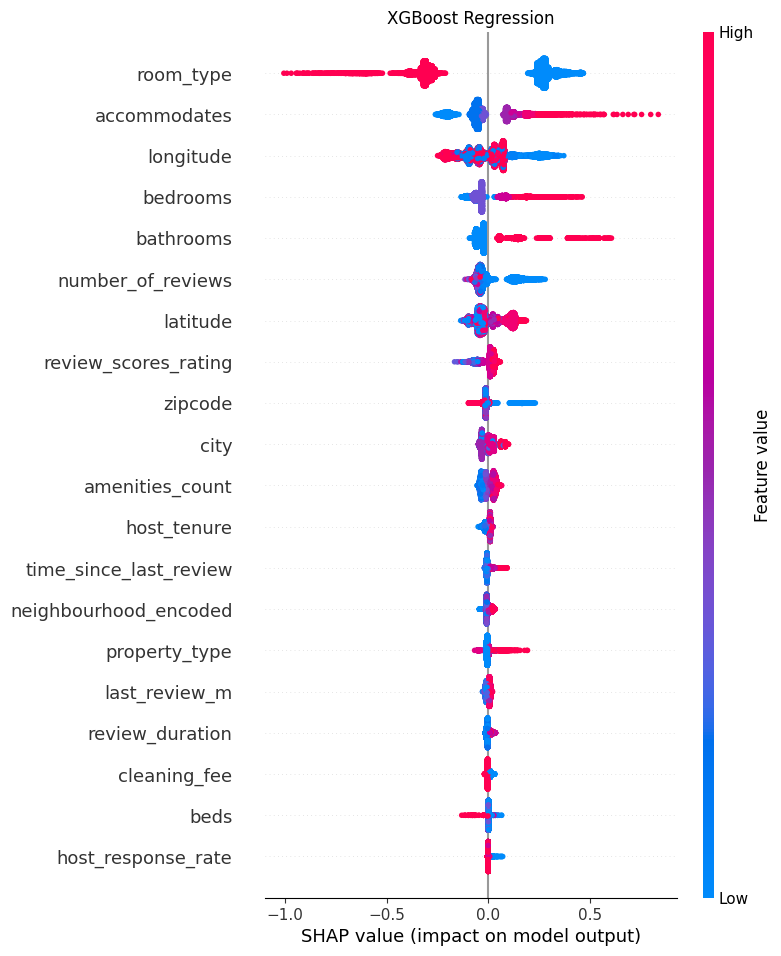

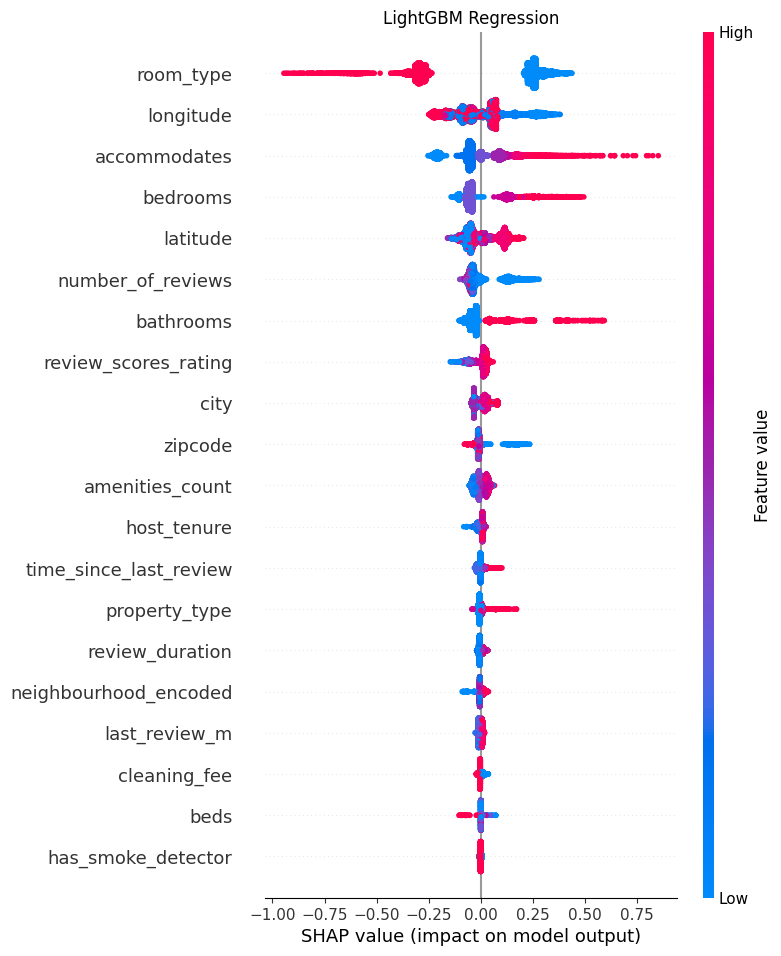

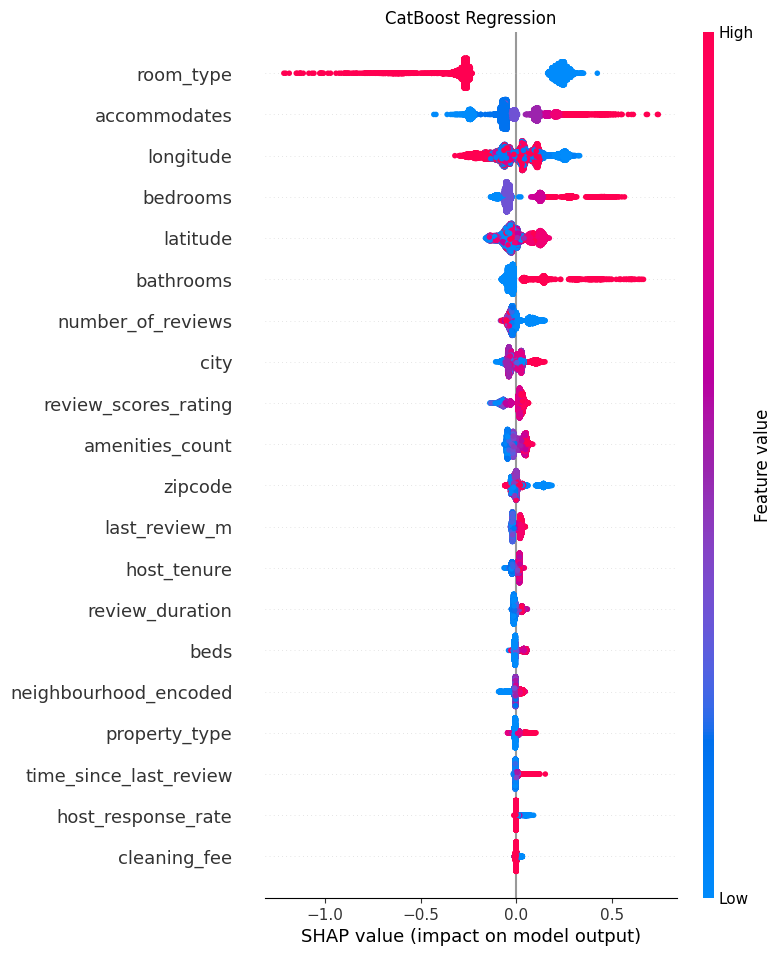

In [ ]:
# Plot SHAP summary plots for each model
shap.summary_plot(xgb_shap_values, X_test, feature_names=X_test.columns, show=False)
plt.title('XGBoost Regression')
plt.savefig('xgboost_shap_summary_plot.png')
plt.show()

shap.summary_plot(lgb_shap_values, X_test, feature_names=X_test.columns, show=False)
plt.title('LightGBM Regression')
plt.savefig('lightgbm_shap_summary_plot.png')
plt.show()

shap.summary_plot(catboost_shap_values, X_test, feature_names=X_test.columns, show=False)
plt.title('CatBoost Regression')
plt.savefig('catboost_shap_summary_plot.png')
plt.show()


---

# XGBoost

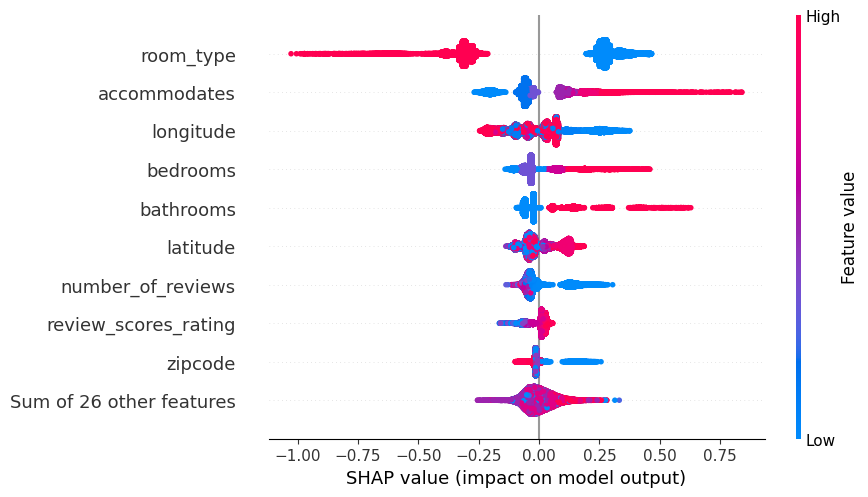

In [ ]:
explainer = shap.TreeExplainer(trained_models["XGBoost"]["model"])
explanation = explainer(X=X_train,y=y_train)

shap.plots.beeswarm(explanation)


In [ ]:
shap_values = explainer(X_train,y_train)


In [ ]:
# visualize the first prediction's explanation
shap.plots.force(shap_values[0, ...])

In [ ]:
shap.force_plot(
    explainer.expected_value, shap_values.values[:1000, :], X_train.iloc[:1000, :]
)

---

# CatBoost

In [ ]:
shap.initjs()


In [ ]:
explainer = shap.TreeExplainer(trained_models["CatBoost"]["model"])
shap_values = explainer(X_train,y_train)

# visualize the first prediction's explanation
shap.plots.force(shap_values[0, ...])

The above explanation shows features each contributing to push the model output from the base value (the average model output over the training dataset we passed) to the model output. Features pushing the prediction higher are shown in red, those pushing the prediction lower are in blue.

If we take many explanations such as the one shown above, rotate them 90 degrees, and then stack them horizontally,

In [ ]:
shap.force_plot(
    explainer.expected_value, shap_values.values[:1000, :], X_train.iloc[:1000, :]
)

To understand how a single feature affects the output of the model, we can plot the SHAP value of that feature vs. the value of the feature for all the examples in a dataset. Since SHAP values represent a feature’s responsibility for a change in the model output,

---

# LightBoost

In [ ]:
explainer = shap.TreeExplainer(trained_models["LightGBM"]["model"])
shap_values = explainer(X_train, y_train)

# visualize the first prediction's explanation
shap.plots.force(shap_values[0, ...])

In [ ]:
shap.force_plot(
    explainer.expected_value, shap_values.values[1, :], X_train.iloc[0, :]
)

In [ ]:
shap.force_plot(
    explainer.expected_value, shap_values.values[:1000, :], X_train.iloc[:1000, :]
)

---

## Saving the shap values and use them in the front page


# Model Card

In [ ]:
model_details = """
  # Model Details

  ## Description
  * Model name: XgBoost
  * Model version
  * Model author: Darshan kumar
  * Model type: Regression Task
  * Model architecture: Include any relevant information about algorithms, parameters, etc.
  * Date
  * contact: Darshankumar@gmail.com

  ## Intended use
  * Primary use case: building a predective model for predicting 'log_price' of home
"""

In [ ]:
training_dataset = """
  # Training dataset

  * Training dataset: The training dataset comprises data collected from a variety of sources, primarily focusing on listings from an online accommodation platform. These listings include details such as 'id', 'accommodates', 'bathrooms', 'zipcode', 'neighbourhood_encoded', 'host_response_rate', 'number_of_reviews', 'review_scores_rating', 'bedrooms', 'latitude', 'longitude', 'beds', 'review_duration', 'time_since_last_review', 'host_tenure', 'average_review_score', 'amenities_count', 'has_wireless_internet', 'has_kitchen', 'has_heating', 'has_essentials', 'has_smoke_detector', 'first_review_m', 'host_since_m', 'last_review_m', 'property_type', 'room_type', 'bed_type', 'cancellation_policy', 'city', 'host_has_profile_pic', 'host_identity_verified', 'instant_bookable', 'cleaning_fee', 'sentiment_category'.
  * Training period: The training dataset spans from a recent timeframe, capturing data from the past few years up to the present.
  * Sub-groups: The dataset includes relevant sub-groups such as demographic information, property characteristics, and host-related attributes.
  * Limitations: While efforts were made to ensure data accuracy, there are known limitations inherent to the dataset. These may include missing values, inconsistencies, or biases in the data collection process.
  * Pre-processing: Prior to analysis, the data underwent various pre-processing steps including cleaning, normalization, and feature engineering to ensure compatibility and optimize predictive modeling performance.

"""

In [ ]:
model_evaluation = """
  # Model evaluation

 * Evaluation process: The model was evaluated using standard regression evaluation techniques, such as mean squared error (MSE), root mean squared error (RMSE), mean absolute error (MAE), and R-squared (R2) score. These metrics provide insight into the model's ability to accurately predict numerical outcomes.
 * Evaluation dataset: The evaluation dataset was created by partitioning the original dataset into separate training and evaluation sets. The evaluation set consists of a subset of the data that was not used during model training, ensuring unbiased assessment of the model's predictive performance on unseen data.
 * Metrics: Key model quality metrics for regression tasks include mean squared error (MSE), root mean squared error (RMSE), mean absolute error (MAE), and R-squared (R2) score. These metrics quantify the difference between predicted and actual values, providing an indication of the model's accuracy and goodness of fit.
 * Decision threshold: In regression tasks, there isn't a decision threshold in the same sense as classification tasks. Instead, the model's predictions are continuous numerical values, and evaluation metrics are used to assess the closeness of these predictions to the actual target values.

"""

In [ ]:
# !pip install evidently

In [ ]:
train_data['prediction'] = xgb_reg.predict(X)

In [ ]:
train_data.columns = cols = ['id',
 'target',
 'accommodates',
 'bathrooms',
 'zipcode',
 'neighbourhood_encoded',
 'host_response_rate',
 'number_of_reviews',
 'review_scores_rating',
 'bedrooms',
 'latitude',
 'longitude',
 'beds',
 'review_duration',
 'time_since_last_review',
 'host_tenure',
 'average_review_score',
 'amenities_count',
 'has_wireless_internet',
 'has_kitchen',
 'has_heating',
 'has_essentials',
 'has_smoke_detector',
 'first_review_m',
 'host_since_m',
 'last_review_m',
 'property_type',
 'room_type',
 'bed_type',
 'cancellation_policy',
 'city',
 'host_has_profile_pic',
 'host_identity_verified',
 'instant_bookable',
 'cleaning_fee',
 'sentiment_category',
 'prediction']

In [ ]:
model_card = Report(metrics=[
    Comment(model_details),
    Comment(training_dataset),
    DatasetSummaryMetric(),
    Comment(model_evaluation),
    RegressionQualityMetric(),
    RegressionErrorDistribution(),
])

model_card.run(current_data=train_data[:60000], reference_data=train_data[60000:])
model_card

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_regression.py:918: UndefinedMetricWarning:

R^2 score is not well-defined with less than two samples.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_regression.py:918: UndefinedMetricWarning:

R^2 score is not well-defined with less than two samples.



In [1]:
!jupyter nbconvert --to html Homestay_LabelEncode_Mt.ipynb

[NbConvertApp] Converting notebook Homestay_LabelEncode_Mt.ipynb to html
[NbConvertApp] Writing 10632456 bytes to Homestay_LabelEncode_Mt.html


: 